繋がりながら次々と風景の変わるパノラマ画像群をStable Diffusionを使って生成する。

生成した画像はreact-three-fiber及びreact-xrを使って、スクロールすると背景が変化する360度背景として使用した。

Stable Diffuionについては以下を参照
論文  
https://arxiv.org/abs/2112.10752<br>
<br>
GitHub  
https://github.com/CompVis/stable-diffusion<br>
<br>
<a href="https://colab.research.google.com/github/kaz12tech/ai_demos/blob/master/StableDiffusion_inpainting_demo.ipynb" target="_blank"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

このノートブックは以下を参考にした。

https://github.com/kaz12tech/ai_demos/blob/main/StableDiffusion_inpainting_demo.ipynb

https://github.com/kaz12tech/ai_demos

# 環境セットアップ

## GPU確認

In [ ]:
!nvidia-smi

Thu Oct  6 12:27:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## GitHubからコード取得

In [ ]:
%cd /content

!git clone https://github.com/huggingface/diffusers.git -b v0.3.0
!sed -E -i "s/sample\(generator=generator\)/sample\(\)/" /content/diffusers/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_inpaint.py

/content
Cloning into 'diffusers'...
remote: Enumerating objects: 8940, done.
remote: Counting objects: 100% (1908/1908), done.
remote: Compressing objects: 100% (407/407), done.
remote: Total 8940 (delta 1663), reused 1570 (delta 1468), pack-reused 7032
Receiving objects: 100% (8940/8940), 2.61 MiB | 25.67 MiB/s, done.
Resolving deltas: 100% (5908/5908), done.
Note: checking out '3f55d1359fb7b93070d87c2afe9c453668249d45'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>



## ライブラリのインストール

In [ ]:
%cd /content

!pip install diffusers transformers scipy ftfy

/content
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 153 kB 19.6 MB/s 
     |████████████████████████████████| 4.9 MB 51.1 MB/s 
     |████████████████████████████████| 53 kB 1.6 MB/s 
     |████████████████████████████████| 163 kB 69.2 MB/s 
     |████████████████████████████████| 6.6 MB 57.1 MB/s 


## Access Token取得
[Huggingface](https://huggingface.co/)にSign Up後メール認証<br>
その後、[CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4)にアクセスし以下に同意<br>
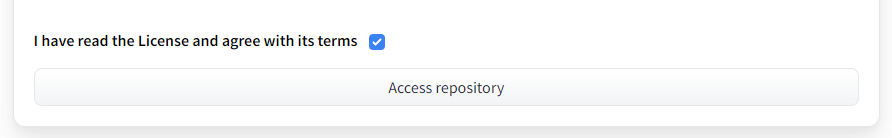
<br><br>
その後、Settings → Access Token
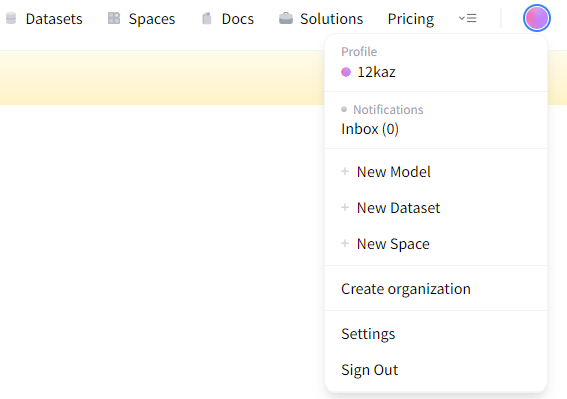


In [ ]:
access_tokens="" # @param {type:"string"}

## ライブラリのインポート

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

import torch
from torch import autocast

%cd /content/diffusers

# 最初の画像の生成用
from src.diffusers import StableDiffusionPipeline
# 画像に新しい画像を繋げる用
from src.diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint import StableDiffusionInpaintPipeline

/content/diffusers


# 生成

## load model
すでにある画像を上書きするpipeと無から画像を作るmodelとを生成しておく。

In [ ]:
%cd /content/diffusers

device = "cuda"
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16", 
    torch_dtype=torch.float16,
    use_auth_token=access_tokens
).to(device)
model = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16", 
    torch_dtype=torch.float16,
    use_auth_token=access_tokens
).to(device)

/content/diffusers


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/1.34k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/71.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

{'trained_betas'} was not found in config. Values will be initialized to default values.


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

{'trained_betas'} was not found in config. Values will be initialized to default values.


とりあえず最初の画像の元を生成

/content/diffusers


  0%|          | 0/51 [00:00<?, ?it/s]

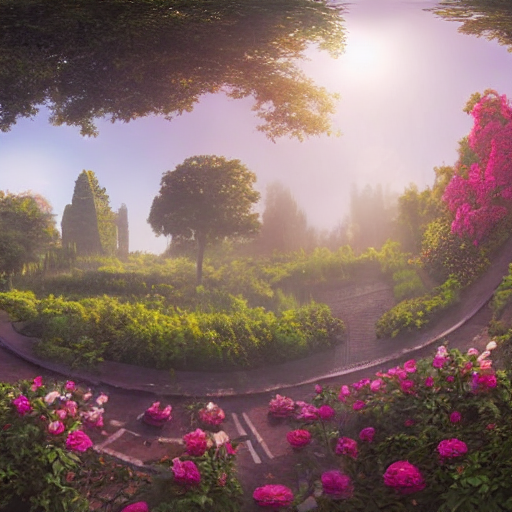

In [ ]:
%cd /content/diffusers
import os
from IPython.display import display

initial_prompt= "360 panorama,skybox,environment map of magnificent rose garden,warm moody light, highly detailed matte fantasy painting"

with autocast("cuda"):
  images = model(
      prompt=initial_prompt,
  )["sample"]
  initial_image = images[0]
  display(initial_image)

これを左右のつながった画像にするために、左右を入れ替える。

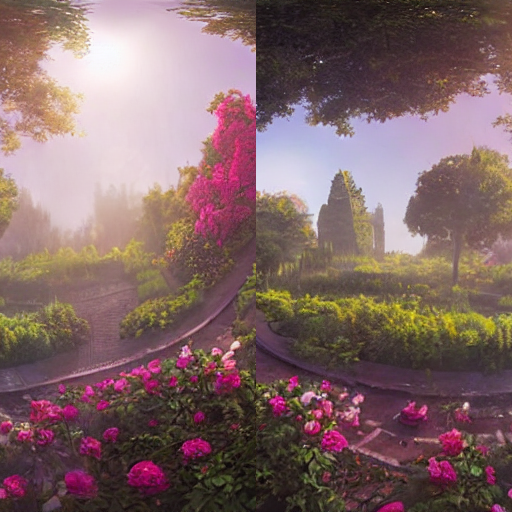

In [ ]:
cropped_left = initial_image.crop((0, 0, 256, 512))
cropped_right = initial_image.crop((256, 0, 512, 512))
reversed_image = Image.new('RGB', (512, 512), 'white')
reversed_image.paste(cropped_left, (256, 0))
reversed_image.paste(cropped_right, (0, 0))
display(reversed_image)

真ん中の部分を上書きする。

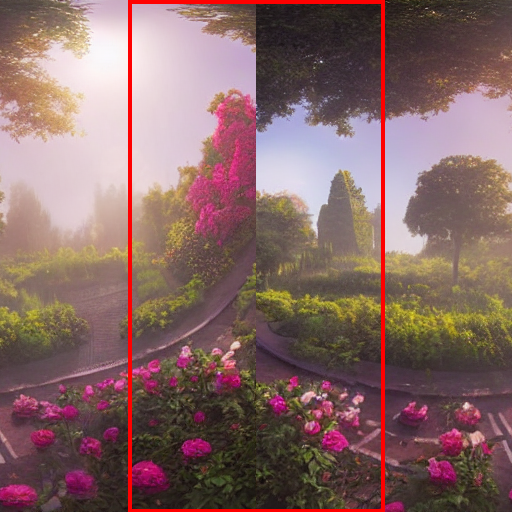

In [ ]:
mask_image_for_panorama = Image.new('RGB', (512, 512), 'white')
mask_image_for_panorama.paste(new_image, (0, 0))
rectcolor = (255, 0, 0)
linewidth = 4
draw = ImageDraw.Draw(mask_image_for_panorama)
draw.rectangle(
    [(256-128, 0), (256+128, 512)], # 左上x,y 右下x,y
    outline=rectcolor, width=linewidth,
  )
display(mask_image_for_panorama)

真ん中を上書きするためのマスク画像を作る。

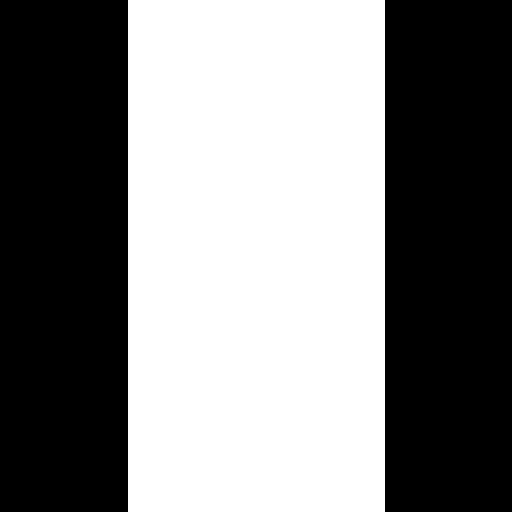

In [ ]:
# 一度すべて黒く塗りつぶし
rectcolor = (0, 0, 0)
draw.rectangle(
    [(0, 0), (512, 512)],
    outline=rectcolor, fill=(0, 0, 0)
    )
# 先ほど設定した矩形箇所白く塗りつぶし
rectcolor = (255, 255, 255)
draw.rectangle(
   [(256-128, 0), (256+128, 512)],
    outline=rectcolor, fill=(255, 255, 255)
    )

mask_image_for_panorama

上書きすれば、左右がつながった360度画像が作れる。

0it [00:00, ?it/s]

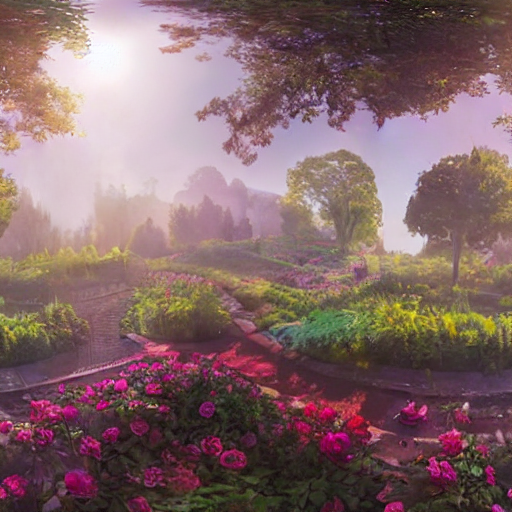

In [ ]:
with autocast("cuda"):
  images = pipe(
    prompt=initial_prompt,
    init_image=reversed_image,
    mask_image=mask_image_for_panorama,
    strength=0.75,
    guidance_scale=7.5,
  )["sample"]
  initial_image = images[0]
  display(initial_image)

一つ目の画像の右の部分に繋がる画像を作るために、左右反転した画像の右側を別のプロンプトで生成した画像で上書きする。

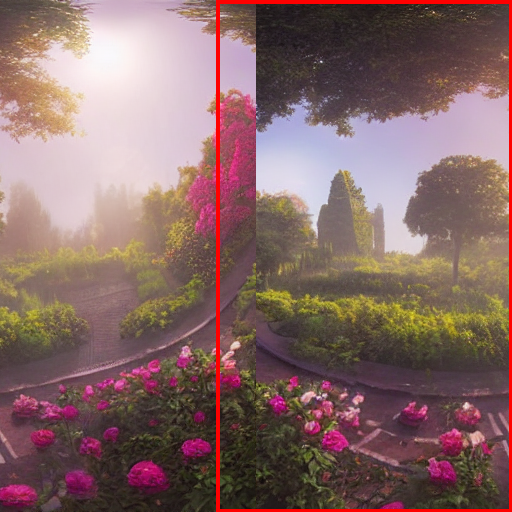

In [ ]:
mask_image = Image.new('RGB', (512, 512), 'white')
mask_image.paste(new_image, (0, 0))
rectcolor = (255, 0, 0)
linewidth = 4
draw = ImageDraw.Draw(mask_image)
draw.rectangle(
    [(256-40, 0), (512, 512)], # 左上x,y 右下x,y
    outline=rectcolor, width=linewidth,
  )
display(mask_image)

マスク画像を作る。

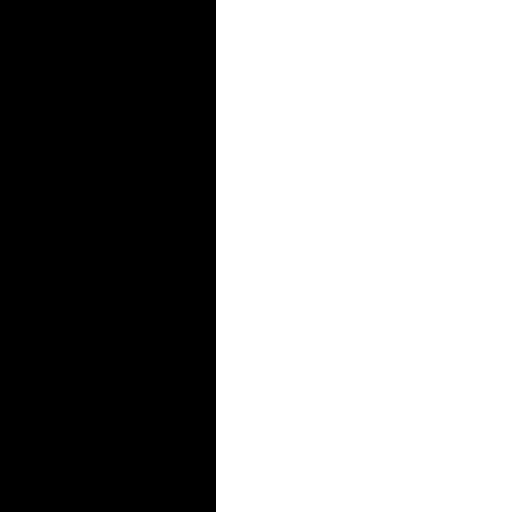

In [ ]:
# 一度すべて黒く塗りつぶし
rectcolor = (0, 0, 0)
draw.rectangle(
    [(0, 0), (512, 512)],
    outline=rectcolor, fill=(0, 0, 0)
    )
# 先ほど設定した矩形箇所白く塗りつぶし
rectcolor = (255, 255, 255)
draw.rectangle(
   [(256-40, 0), (512, 512)],
    outline=rectcolor, fill=(255, 255, 255)
    )

mask_image

これによって、左半分は最初の画像の右側で、右半分が全く異なる新しい場面になった画像が作れる。

In [ ]:
def expand(init_image, prompt):
  cropped_left = init_image.crop((0, 0, 256, 512))
  cropped_right = init_image.crop((256, 0, 512, 512))
  new_image = Image.new('RGB', (512, 512), 'white')
  new_image.paste(cropped_left, (256, 0))
  new_image.paste(cropped_right, (0, 0))
  display(new_image)
  with autocast("cuda"):
    images = pipe(
      prompt=prompt,
      init_image=new_image,
      mask_image=mask_image,
      strength=0.75,
      guidance_scale=7.5,
    )["sample"]
    next_generated = images[0]
    display(next_generated)
    return next_generated

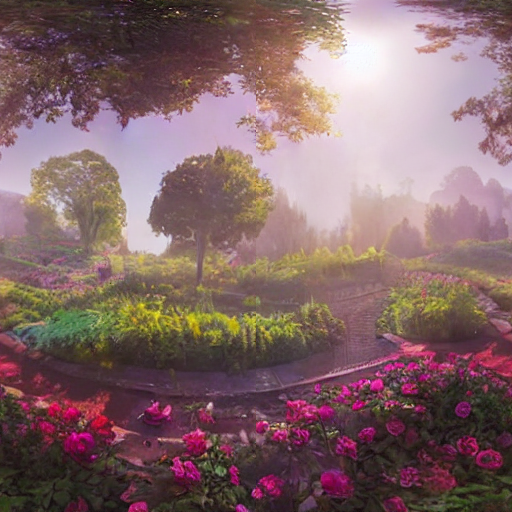

0it [00:00, ?it/s]

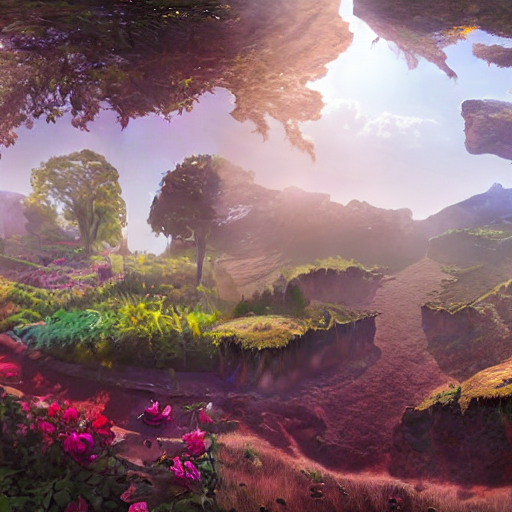

In [ ]:
new_prompt= "360 panorama,skybox,environment map of fire mountain,dark moody light, highly detailed matte fantasy painting"
second_image = expand(initial_image, new_prompt)

これをプロンプトを調節しながら何回も繰り返す（プロンプトを調節しながら行うため、for文で回すことはしていない）

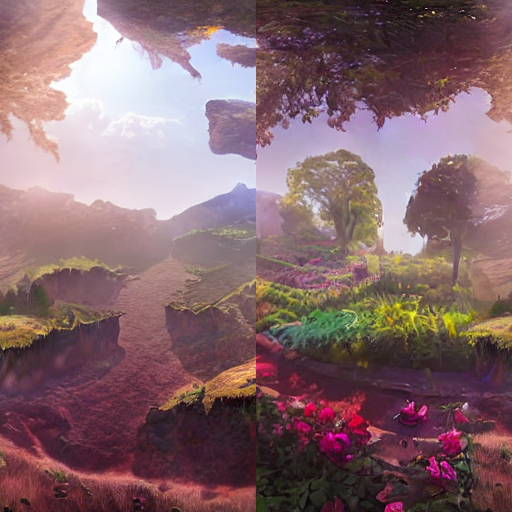

0it [00:00, ?it/s]

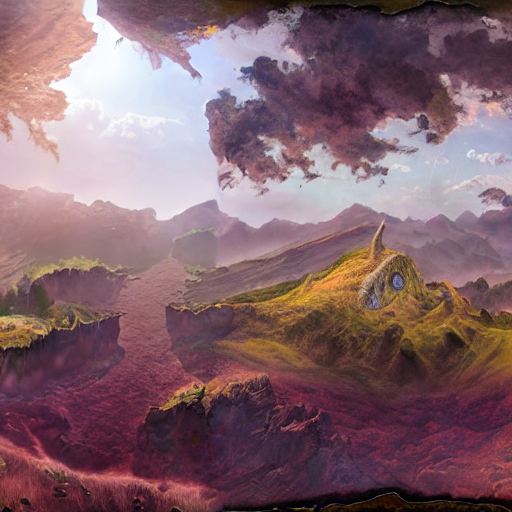

In [ ]:
third_image = expand(second_image, new_prompt)

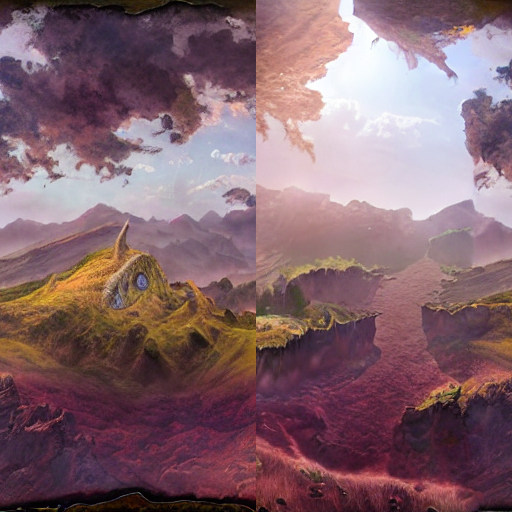

0it [00:00, ?it/s]

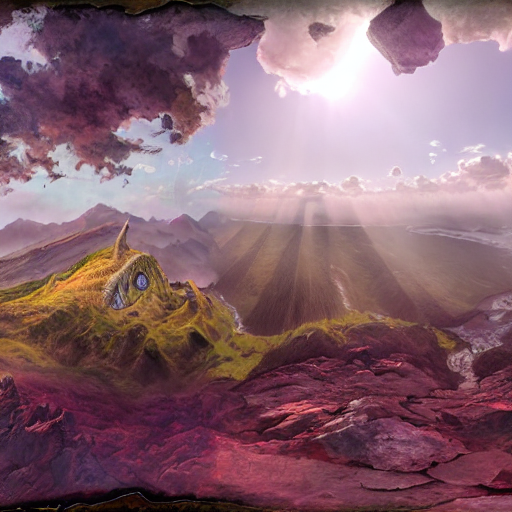

In [ ]:
new_prompt= "360 panorama,skybox,environment map of blue lake,cool moody light, highly detailed matte fantasy painting"
forth_image = expand(third_image, new_prompt)

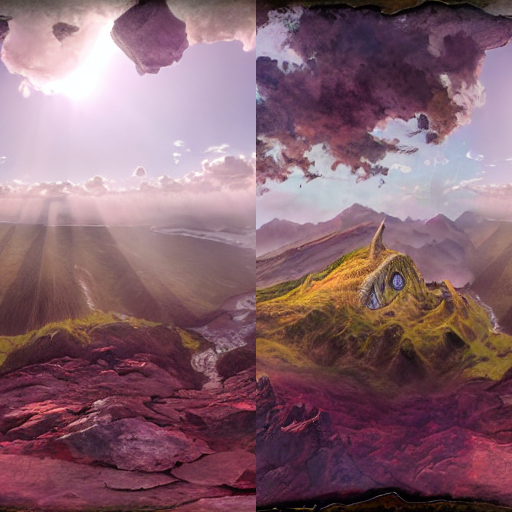

0it [00:00, ?it/s]

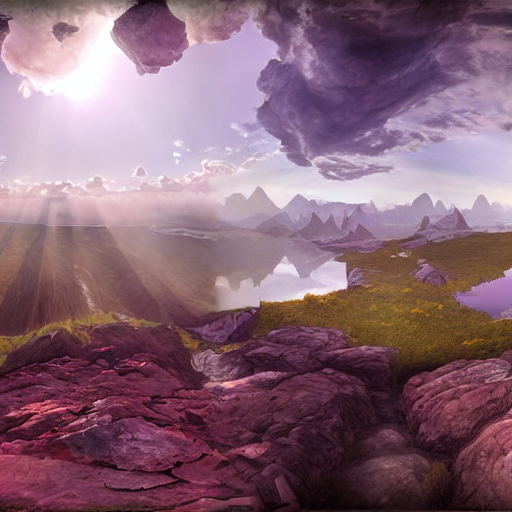

In [ ]:
fifth_image = expand(forth_image, new_prompt)

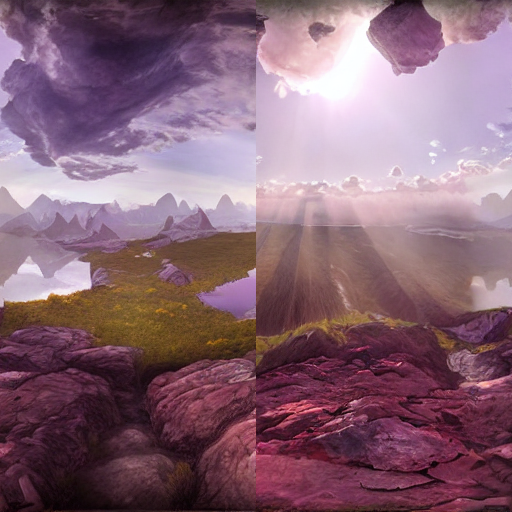

0it [00:00, ?it/s]

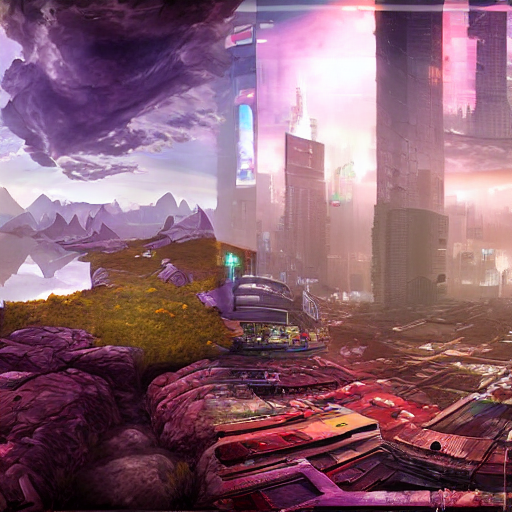

In [ ]:
new_prompt= "360 panorama,skybox,environment map of cyberpunk city,vivid moody light, highly detailed matte fantasy painting"
sixth_image = expand(fifth_image, new_prompt)

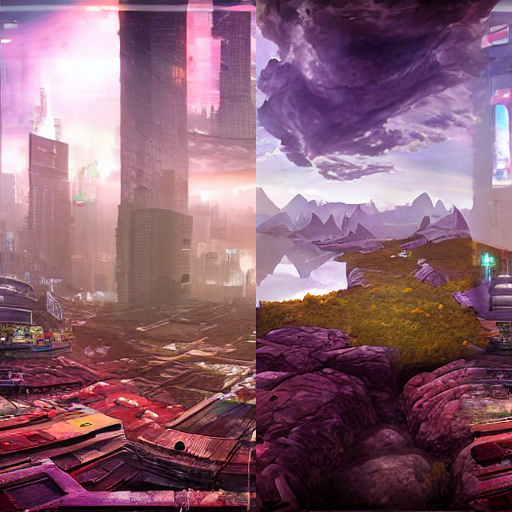

0it [00:00, ?it/s]

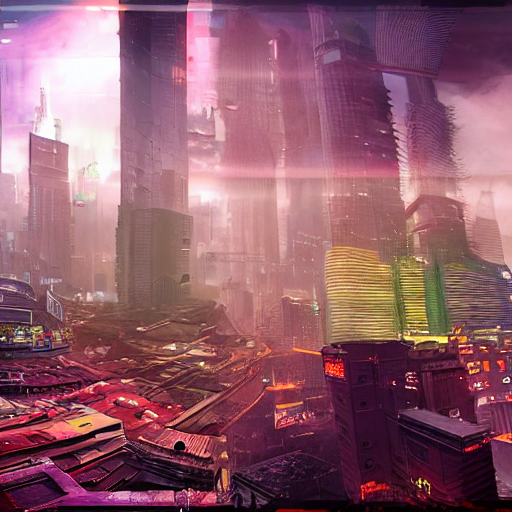

In [ ]:
seventh_image = expand(sixth_image, new_prompt)

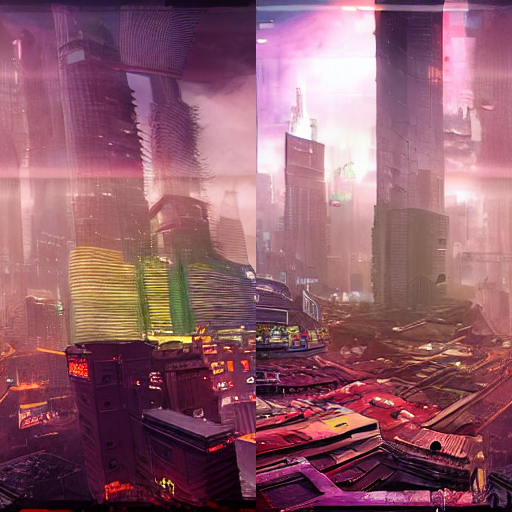

0it [00:00, ?it/s]

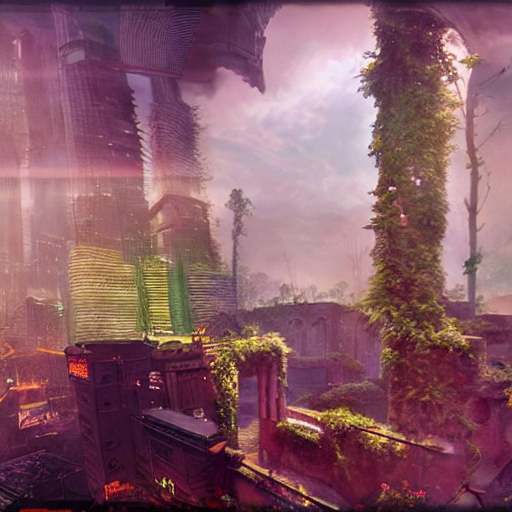

In [ ]:
new_prompt= "360 panorama,skybox,environment map of ivy-covered ruins,warm moody light, highly detailed matte fantasy painting"
eighth_image = expand(seventh_image, new_prompt)

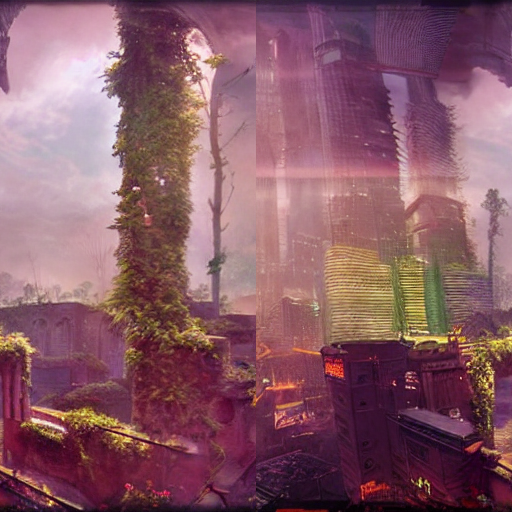

0it [00:00, ?it/s]

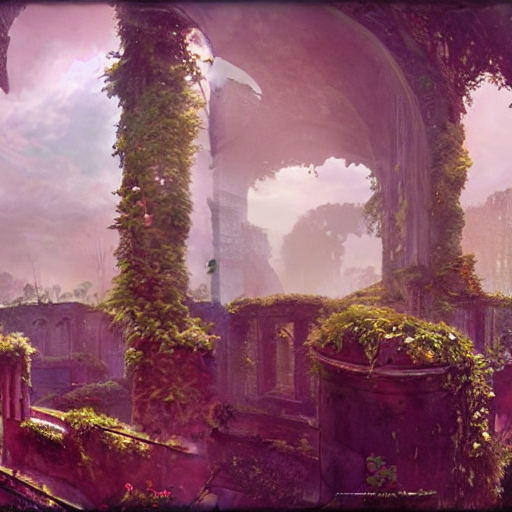

In [ ]:
nineth_image = expand(eighth_image, new_prompt)

最後にnineth_imageの右側をinitial_imageの左側につなげる。

手順は最初の画像の左右をつなげた時と同様に行なった。

後から気づいたが、実はこれでは全体がうまくつながらない。

なぜかというとnineth_imageの右半分を加工してlast_imageの左半分にしているため、
nineth_imageの右半分とlast_imageの左半分は異なる画像になってしまっているからだ。

作り直そうかと思ったが、簡単な画像編集で解決できることに気づいたので、この画像を素材として、最終的な背景画像を作った。

画像編集はsmall_post_process.ipynbで行なっている。

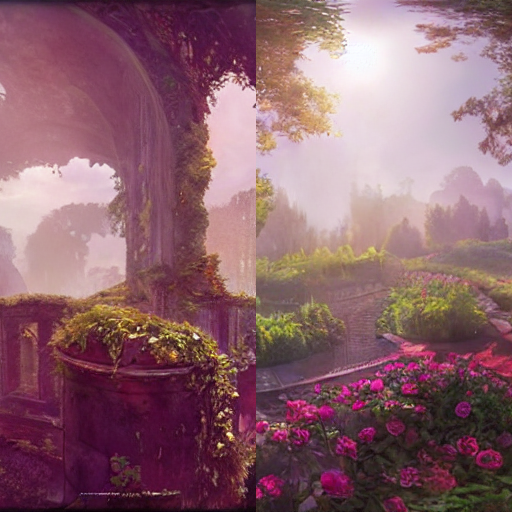

In [ ]:
cropped_left = initial_image.crop((0, 0, 256, 512))
cropped_right = nineth_image.crop((256, 0, 512, 512))
last_image = Image.new('RGB', (512, 512), 'white')
last_image.paste(cropped_left, (256, 0))
last_image.paste(cropped_right, (0, 0))
display(last_image)

0it [00:00, ?it/s]

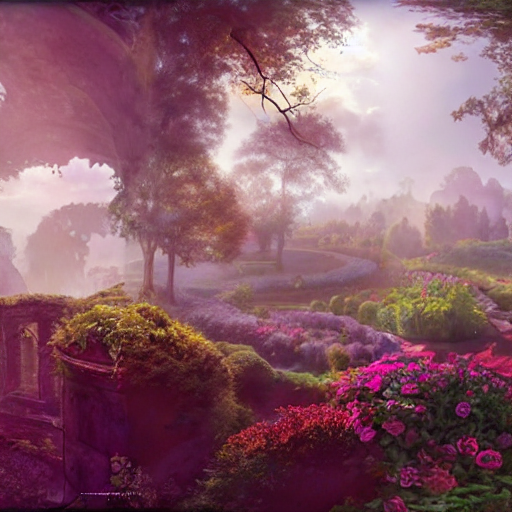

In [ ]:
with autocast("cuda"):
  images = pipe(
    prompt=initial_prompt,
    init_image=last_image,
    mask_image=mask_image_for_panorama,
    strength=0.75,
    guidance_scale=7.5,
  )["sample"]
  last_image = images[0]
  display(last_image)

これらの画像をdriveに保存した。

この後、これらの画像はReal-ESRGANを使って高解像度化したのち、重すぎたのでImageMagickでwebp化して使った。

高解像度化はhigh_resolution.ipynbで行なっている。

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
initial_image.save('/content/drive/MyDrive/Colab Notebooks/images/initial_image.png')
second_image.save('/content/drive/MyDrive/Colab Notebooks/images/second_image.png')
third_image.save('/content/drive/MyDrive/Colab Notebooks/images/third_image.png')
forth_image.save('/content/drive/MyDrive/Colab Notebooks/images/forth_image.png')
fifth_image.save('/content/drive/MyDrive/Colab Notebooks/images/fifth_image.png')
sixth_image.save('/content/drive/MyDrive/Colab Notebooks/images/sixth_image.png')
seventh_image.save('/content/drive/MyDrive/Colab Notebooks/images/seventh_image.png')
eighth_image.save('/content/drive/MyDrive/Colab Notebooks/images/eighth_image.png')
nineth_image.save('/content/drive/MyDrive/Colab Notebooks/images/nineth_image.png')
last_image.save('/content/drive/MyDrive/Colab Notebooks/images/last_image.png')